In [1]:
#Initializing PySpark with your Python shell with BigQuery Connector
from pyspark.sql import SparkSession
spark = SparkSession.builder.config(
"spark.jars.packages",
"com.google.cloud.spark:spark-bigquery-with-dependencies_2.12:0.19.1",

).getOrCreate()

23/11/09 20:49:18 WARN Utils: Your hostname, LAPTOP-JR3B3TTQ resolves to a loopback address: 127.0.1.1; using 172.28.169.28 instead (on interface eth0)
23/11/09 20:49:18 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


:: loading settings :: url = jar:file:/usr/local/lib/python3.10/dist-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /home/shravan/.ivy2/cache
The jars for the packages stored in: /home/shravan/.ivy2/jars
com.google.cloud.spark#spark-bigquery-with-dependencies_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-d193ddb1-0430-40b8-bd9a-6b6c7c030ee5;1.0
	confs: [default]
	found com.google.cloud.spark#spark-bigquery-with-dependencies_2.12;0.19.1 in central
:: resolution report :: resolve 294ms :: artifacts dl 5ms
	:: modules in use:
	com.google.cloud.spark#spark-bigquery-with-dependencies_2.12;0.19.1 from central in [default]
	---------------------------------------------------------------------
	|                  |            modules            ||   artifacts   |
	|       conf       | number| search|dwnlded|evicted|| number|dwnlded|
	---------------------------------------------------------------------
	|      default     |   1   |   0   |   0   |   0   ||   1   |   0   |
	---------------------------------------------------------------

### Note
<font size ="2"> 
Using the connector when invoking PySpark directly
If you are in an environment where you can’t dynamically download dependencies
(e.g., behind a corporate firewall), you can download the jar manually and add its location
for the spark.jars config flag when instantiating your Sparksession.

    
</font>


<font size="2"> 
 An alternative
way, when using pyspark or spark-submit as a way to launch a REPL or a
PySpark job, is to use the --jars configuration flag:
pyspark --jars spark-bigquery-latest.jar
spark-submit --jars spark-bigquery-latest.jar my_job_file.py
If you are using PySpark in the cloud, refer to your provider documentation. Each
cloud provider has a different way of managing Spark dependencies and libraries.
<font>

In [2]:
from functools import reduce
import pyspark.sql.functions as F

#Since all the tables are read the same way, I abstract my reading routine in a reusable function, returning the resulting data frame.

def read_df_from_bq(year):
    #I use the bigquery specialized reader via the format() method.
    return (spark.read.format("bigquery")
    .option("parentProject", "idyllic-aspect-404419")
    .option("table", f"bigquery-public-data.noaa_gsod.gsod{year}")
    # I pass my JSON service account key to the credentialsFile option to tell Google I am allowed to use the BigQuery service.
    .option("credentialsFile", "data/idyllic-aspect-404419-7d9e4a652d86.json")
    .load())

#Method 1 - Reading the stations and gsod tables for 2010 to 2020 using reduce and lambda

gsod = (
reduce(
lambda x, y: x.unionByName(y, allowMissingColumns=True),#I create a lambda function over my list comprehension of dataframes to union them all.
[read_df_from_bq(year) for year in range(2015, 2021)],
)
.dropna(subset=["year", "mo", "da", "temp"])
.where(F.col("temp") != 9999.9)
.drop("date")
)

#Method 2 - Reading the gsod data from 2010 to 2020 via a loop
gsod_alt = read_df_from_bq(2010)
for year in range(2011, 2020):
    gsod_alt = gsod_alt.unionByName(
    read_df_from_bq(year), allowMissingColumns=True
    )
gsod_alt = gsod_alt.drop("date")


### Standard UDF vs Pandas UDF
For the most part, they work just like Python UDFs, with one key difference: 
Python UDFs work on <b>one record </b> at a time, and you express your logic through regular Python code. Scalar UDFs work on <b> one Series </b> at a time, and you express your logic through pandas code.

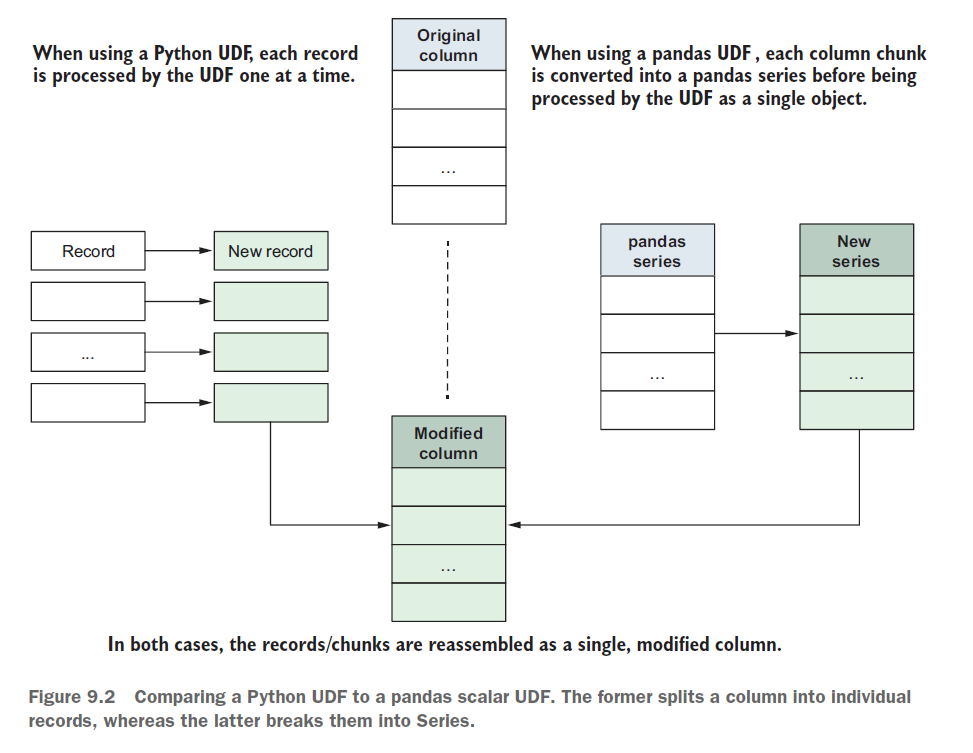

### Series to Series UDF

In [3]:
#Creating a pandas scalar UDF that transforms Fahrenheit into Celisus
import pandas as pd
import pyspark.sql.types as T

#For a scalar UDF, the biggest change happens in the decorator used. I could use the pandas_udf function directly too.

#Series to Series UDF
@F.pandas_udf(T.DoubleType())  
def f_to_c(degrees: pd.Series) -> pd.Series: ##The signature for a Series to Series UDF is a function that takes one or multiple pandas.Series.
    """Transforms Farhenheit to Celsius."""
    return (degrees - 32) * 5 / 9

# Using a Series to Series UDF like any other column manipulation function
gsod = gsod.withColumn("temp_c", f_to_c(F.col("temp")))
gsod.select("temp", "temp_c").distinct().show(5)



/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

+----+-------------------+
|temp|             temp_c|
+----+-------------------+
|37.2| 2.8888888888888906|
|29.6|-1.3333333333333326|
|53.5| 11.944444444444445|
|71.6| 21.999999999999996|
|70.4| 21.333333333333336|
+----+-------------------+
only showing top 5 rows



In [4]:
#Iterable,Iterator,Generator,Yield - Refresher

#Iterable - A Python object which can be looped over or iterated over in a loop. Examples of iterables include lists, sets, tuples, dictionaries, strings, etc. 
list = [1,2,3,4] #iterable

#Iterator -An iterator is an object that can be iterated upon. Thus, iterators contain a countable number of values. 
iterator = iter(list) # iterator
print(next(iterator))
print(next(iterator))
#We can say iterators have a lazy nature: when an iterator is created, the elements are not yielded until they are requested by next or list(),tuple() functions.

#Generator - A special type of function which does not return a single value: it returns an iterator object with a sequence of values.
def factors(n):
  for val in range(1, n+1):
      if n % val == 0:
          yield val #Yield - A python keyword similar to the return keyword, except yield returns a generator object instead of a value. 

factors_of_20 = factors(20)
print(factors_of_20)
print(next(factors_of_20))
print(next(factors_of_20))
print(next(factors_of_20))

#The yield keyword controls the flow of a generator function. Instead of exiting the function as seen when return is used, 
#the yield keyword returns the function but remembers the state of its local variables.
#Thus, it is possible for us to resume the function execution at our own will. 


1
2
<generator object factors at 0x7f9630589d20>
1
2
4


### Iterator of Series to Iterator of series UDF

When working with the Series to Series UDF, we assumed that PySpark would
give us one batch at a time. Here, since we are working with an Iterator of
Series, we are explicitly iterating over each batch one by one. PySpark will distribute
the work for us.

In [5]:
from time import sleep
from typing import Iterator
@F.pandas_udf(T.DoubleType())
def f_to_c2(degrees: Iterator[pd.Series]) -> Iterator[pd.Series]:
    """Transforms Farhenheit to Celcius."""
    sleep(5) #We simulate a cold start using sleep() for five seconds. The cold start will happen on each worker once, rather than for every batch
    for batch in degrees: #Batch will be set according to spark.sql.execution.arrow.maxRecordsPerBatch value
        yield (batch - 32) * 5 / 9 #Since we are working with an iterator here, we iterate over each batch, using yield (instead of return).
        
gsod.select(
"temp", f_to_c2(F.col("temp")).alias("temp_c")
).distinct().show(5)



/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

+----+-------------------+
|temp|             temp_c|
+----+-------------------+
|37.2| 2.8888888888888906|
|29.6|-1.3333333333333326|
|53.5| 11.944444444444445|
|71.6| 21.999999999999996|
|70.4| 21.333333333333336|
+----+-------------------+
only showing top 5 rows



### Iterator of Mulitple Series to Iterator of Series

In [6]:
from typing import Tuple
@F.pandas_udf(T.DateType())
def create_date(year_mo_da: Iterator[Tuple[pd.Series, pd.Series, pd.Series]]) -> Iterator[pd.Series]:
    #year_mo_da is an Iterator of Tuple of (three) Series. The iterator is for processing the data from the columns/series one batch at a time. We wrap
    #the columns/series in a tuple so the batch size is consistent when PySpark does the processing.
    """Merges three cols (representing Y-M-D of a date) into a Date col."""
    for year, mo, da in year_mo_da:
        #We iterate over each batch using a for loop. Because the columns are wrapped into a tuple, we unpack it using multiple assignments
        yield pd.to_datetime(
        pd.DataFrame(dict(year=year, month=mo, day=da))
        ) #pd_to_datetime requires a data frame containing the column’s year, month, and day. We wrap our series into a dict to provide the relevant column names and pass the result to pd.DataFrame before returning the date Series.
        
gsod.select(
"year", "mo", "da",
create_date(F.col("year"), F.col("mo"), F.col("da")).alias("date"),
).distinct().show(5)

/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

+----+---+---+----------+
|year| mo| da|      date|
+----+---+---+----------+
|2015| 06| 17|2015-06-17|
|2015| 06| 04|2015-06-04|
|2015| 11| 05|2015-11-05|
|2015| 04| 05|2015-04-05|
|2015| 05| 02|2015-05-02|
+----+---+---+----------+
only showing top 5 rows



### Grouped Aggregate UDFs

In [7]:
#Series to Scalar UDFs (grouped aggregate UDF)
from sklearn.linear_model import LinearRegression

@F.pandas_udf(T.DoubleType())
def rate_of_change_temperature(day: pd.Series, temp: pd.Series) -> float:
    """Returns the slope of the daily temperature for a given period of time."""
    return (
    LinearRegression() # I initialize the LinearRegression object.
    .fit(X=day.astype(int).values.reshape(-1, 1), y=temp) #The fit method trains the model, using the day Series as a feature and the temp series as the prediction.
    .coef_[0] #Since I only have one feature, I select the first value of the coef_ attribute as my slope.
    )

result = gsod.groupby("stn", "year", "mo").agg(
rate_of_change_temperature(gsod["da"], gsod["temp"]).alias(
"rt_chg_temp"
)
)

result.show(5,False)
#Check output in below cell - output is present

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/pytho

+------+----+---+---------------------+
|stn   |year|mo |rt_chg_temp          |
+------+----+---+---------------------+
|008411|2015|02 |-0.05555555555555549 |
|008411|2015|12 |-0.04769744160177969 |
|008414|2016|02 |-0.055147058823529334|
|008415|2016|01 |-0.013225806451612927|
|008418|2015|01 |0.023911290322580634 |
+------+----+---+---------------------+
only showing top 5 rows



/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

### TIP
By default, Spark will aim for 10,000 records per batch. You can customize the maximum size of each batch using the spark.sql.execution.arrow
.maxRecordsPerBatch config when creating the SparkSession object; 10,000
records is a good balance for most jobs. If you are working with memorystarved
executors, you might want to reduce this.

### Grouped Map UDFs

UDF maps over each batch and returns a (pandas) data frame that gets combined
back into a single (Spark) data frame

In [8]:
def scale_temperature(temp_by_day: pd.DataFrame) -> pd.DataFrame:
    """Returns a simple normalization of the temperature for a site.
    If the temperature is constant for the whole window, defaults to 0.5."""
    temp = temp_by_day.temp
    answer = temp_by_day[["stn", "year", "mo", "da", "temp"]]
    if temp.min() == temp.max():
        return answer.assign(temp_norm=0.5)
    return answer.assign(
    temp_norm=(temp - temp.min()) / (temp.max() - temp.min())
    )

#Split-apply-combing in Pyspark
gsod_map = gsod.groupby("stn", "year", "mo").applyInPandas(
scale_temperature,
schema=(
"stn string, year string, mo string, "
"da string, temp double, temp_norm double"
),
)

gsod_map.show(5,False)

/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

+------+----+---+---+----+-------------------+
|stn   |year|mo |da |temp|temp_norm          |
+------+----+---+---+----+-------------------+
|008411|2015|12 |04 |84.0|0.7826086956521736 |
|008411|2015|12 |24 |82.8|0.26086956521738913|
|008411|2015|12 |03 |83.8|0.6956521739130419 |
|008411|2015|12 |28 |82.7|0.21739130434782636|
|008411|2015|12 |19 |83.0|0.34782608695652095|
+------+----+---+---+----+-------------------+
only showing top 5 rows



/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

### What to use When ?

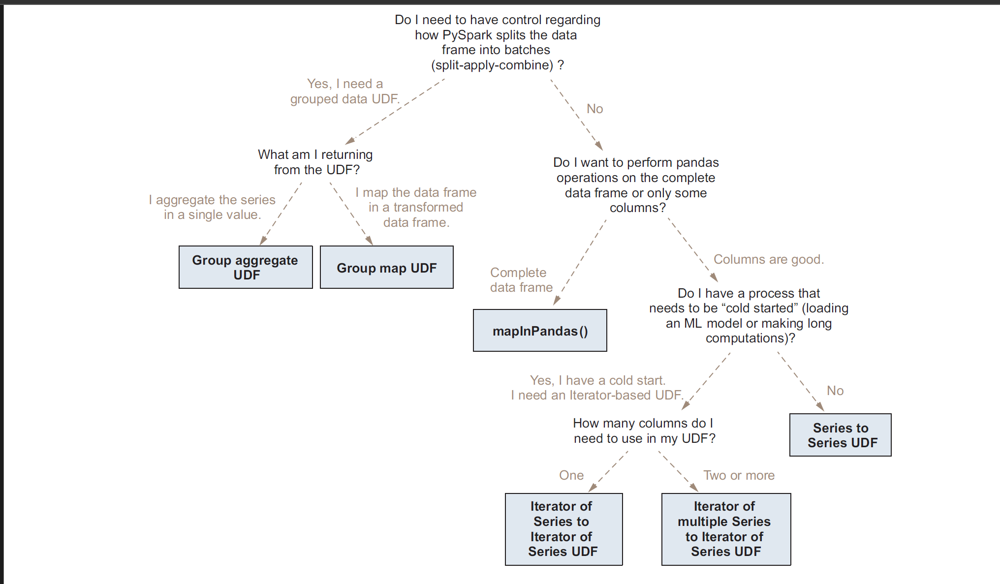

In [9]:
#Testing on pandas  
#To test your pandas UDF, my favorite strategy is to bring a sample of the data using the func() method of my UDF

gsod_local = gsod_map.where(
"year = '2018' and mo = '08' and stn = '710920'"
).toPandas()



#print(rate_of_change_temperature.func(gsod_local["da"], gsod_local["temp_norm"]))

/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr

In [ ]:
print(type(gsod_local))
print(gsod_local.columns)

/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr/local/lib/python3.10/dist-packages/pyspark/python/lib/pyspark.zip/pyspark/sql/pandas/serializers.py:224: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
/usr